In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import re
from matplotlib.lines import Line2D
import matplotlib as mpl

import os


# Data Processing

In [3]:
df = pd.read_csv("..\only_cyc.csv")
print(df.shape)
df = df[df["survey_depth"] == 10].copy()
print(df.shape)

(8820, 12)
(4410, 12)


In [4]:
df

,survey_depth,point_machine_classification,site_name,year,site_latitude,site_longitude,SITE_NO,REEF_NAME,mean_hcc,cyc_dis,dhw_dis,other_dis
4410,10,HCC,Reef1 Site 1,1,-13.827068,5.78289,Site 1,Reef 1,56.431136,0.000000,0.404054,0.459397
4411,10,HCC,Reef1 Site 1,2,-13.827068,5.78289,Site 1,Reef 1,59.223348,0.000000,0.441294,0.389551
4412,10,HCC,Reef1 Site 1,3,-13.827068,5.78289,Site 1,Reef 1,60.383573,0.000000,0.360332,0.536762
4413,10,HCC,Reef1 Site 1,4,-13.827068,5.78289,Site 1,Reef 1,62.380281,0.000000,0.393523,0.424126
4414,10,HCC,Reef1 Site 1,5,-13.827068,5.78289,Site 1,Reef 1,62.200000,0.000000,0.392545,0.545187
...,...,...,...,...,...,...,...,...,...,...,...,...
8815,10,HCC,Reef9 Site 3,26,-13.077068,4.35289,Site 3,Reef 9,38.612887,0.000000,0.413400,0.618017
8816,10,HCC,Reef9 Site 3,27,-13.077068,4.35289,Site 3,Reef 9,38.819626,0.299737,0.690803,0.533889
8817,10,HCC,Reef9 Site 3,28,-13.077068,4.35289,Site 3,Reef 9,38.690226,0.000000,0.764509,0.741342
8818,10,HCC,Reef9 Site 3,29,-13.077068,4.35289,Site 3,Reef 9,38.027459,0.000000,0.638146,0.579911


In [5]:

df = df.sort_values(['site_name', 'year']).reset_index(drop=True)


In [ ]:
df

In [6]:

# Lag within each site group
df['cyc_lag1'] = df.groupby(['site_name'])['cyc_dis'].shift(1)
df['dhw_lag1'] = df.groupby(['site_name'])['dhw_dis'].shift(1)
df['other_lag1'] = df.groupby(['site_name'])['other_dis'].shift(1)

df['cyc_lag2'] = df.groupby(['site_name'])['cyc_dis'].shift(2)
df['dhw_lag2'] = df.groupby(['site_name'])['dhw_dis'].shift(2)
df['other_lag2'] = df.groupby(['site_name'])['other_dis'].shift(2)

# df['mhcc_lag1'] = df.groupby(['site_name'])['mean_hcc'].shift(1)


In [7]:
df

,survey_depth,point_machine_classification,site_name,year,site_latitude,site_longitude,SITE_NO,REEF_NAME,mean_hcc,cyc_dis,dhw_dis,other_dis,cyc_lag1,dhw_lag1,other_lag1,cyc_lag2,dhw_lag2,other_lag2
0,10,HCC,Reef1 Site 1,1,-13.827068,5.78289,Site 1,Reef 1,56.431136,0.000000,0.404054,0.459397,NaN,NaN,NaN,NaN,NaN,NaN
1,10,HCC,Reef1 Site 1,2,-13.827068,5.78289,Site 1,Reef 1,59.223348,0.000000,0.441294,0.389551,0.000000,0.404054,0.459397,NaN,NaN,NaN
2,10,HCC,Reef1 Site 1,3,-13.827068,5.78289,Site 1,Reef 1,60.383573,0.000000,0.360332,0.536762,0.000000,0.441294,0.389551,0.000000,0.404054,0.459397
3,10,HCC,Reef1 Site 1,4,-13.827068,5.78289,Site 1,Reef 1,62.380281,0.000000,0.393523,0.424126,0.000000,0.360332,0.536762,0.000000,0.441294,0.389551
4,10,HCC,Reef1 Site 1,5,-13.827068,5.78289,Site 1,Reef 1,62.200000,0.000000,0.392545,0.545187,0.000000,0.393523,0.424126,0.000000,0.360332,0.536762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,10,HCC,Reef9 Site 3,26,-13.077068,4.35289,Site 3,Reef 9,38.612887,0.000000,0.413400,0.618017,0.000000,0.513882,0.508198,0.000000,0.589691,0.638079
4406,10,HCC,Reef9 Site 3,27,-13.077068,4.35289,Site 3,Reef 9,38.819626,0.299737,0.690803,0.533889,0.000000,0.413400,0.618017,0.000000,0.513882,0.508198
4407,10,HCC,Reef9 Site 3,28,-13.077068,4.35289,Site 3,Reef 9,38.690226,0.000000,0.764509,0.741342,0.299737,0.690803,0.533889,0.000000,0.413400,0.618017
4408,10,HCC,Reef9 Site 3,29,-13.077068,4.35289,Site 3,Reef 9,38.027459,0.000000,0.638146,0.579911,0.000000,0.764509,0.741342,0.299737,0.690803,0.533889


In [ ]:
# trainval = df[df['year'].between(1,22)].copy()
# test  = df[df['year'].between(23,30)].copy()
# print(trainval.shape)
# print(test.shape)

# # removed rows that don’t have a lag value (first and second year in each group)
# trainval = trainval.dropna(subset=['cyc_lag2'])
# print(trainval.shape)



(3234, 18)
(1176, 18)
(2940, 18)


In [8]:
trainval = df[df['year'].between(1,29)].copy()
test  = df[df['year']==30].copy()
print(trainval.shape)
print(test.shape)

# removed rows that don’t have a lag value (first and second year in each group)
trainval = trainval.dropna(subset=['cyc_lag2'])
print(trainval.shape)

(4263, 18)
(147, 18)
(3969, 18)


In [ ]:
trainval

In [ ]:
test

In [9]:
covariates = [
    'cyc_dis', 'dhw_dis', 'other_dis',
    'cyc_lag1', 'dhw_lag1', 'other_lag1',
    'cyc_lag2', 'dhw_lag2', 'other_lag2',
    'year', 'site_longitude', 'site_latitude'
    # 'mhcc_lag1'

]
response = 'mean_hcc'


https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [ ]:
# # From trainval data set, randomly 70% of observations for training, 30% for validation 
# train, val = train_test_split(
#     trainval,
#     test_size= 0.3,
#     random_state=  1,
#     shuffle= True
# )

# X_train, y_train = train[covariates], train[response]
# X_val,   y_val   = val[covariates],   val[response]

# X_test, y_test = test[covariates], test[response]

# print("Train:", X_train.shape, y_train.shape)
# print("Val:  ", X_val.shape, y_val.shape)
# print("Test: ", X_test.shape, y_test.shape)


Train: (2058, 12) (2058,)
Val:   (882, 12) (882,)
Test:  (1176, 12) (1176,)


In [10]:
# From trainval data set, randomly 70% of observations for training, 30% for validation 
train, val = train_test_split(
    trainval,
    test_size= 0.3,
    random_state=  1,
    shuffle= True
)


In [11]:
test  = pd.concat([val,test])

X_train, y_train = train[covariates], train[response]
X_test, y_test = test[covariates], test[response]

print("Train:", X_train.shape, y_train.shape)
print("Test: ", X_test.shape, y_test.shape)

Train: (2778, 12) (2778,)
Test:  (1338, 12) (1338,)


In [ ]:
X_train

In [ ]:
# scaler = StandardScaler()

# X_train_scaled = scaler.fit_transform(X_train)

# # Applying same scaler to bothe val and test
# X_val_scaled   = scaler.transform(X_val)
# X_test_scaled  = scaler.transform(X_test)

# # turning back into data farames with same column names
# X_train_scaled = pd.DataFrame(X_train_scaled, columns=covariates, index=X_train.index)
# X_val_scaled   = pd.DataFrame(X_val_scaled,   columns=covariates, index=X_val.index)
# X_test_scaled  = pd.DataFrame(X_test_scaled, columns=covariates, index=X_test.index)



In [12]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)

# Applying same scaler to test
X_test_scaled  = scaler.transform(X_test)

# turning back into data farames with same column names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=covariates, index=X_train.index)
X_test_scaled  = pd.DataFrame(X_test_scaled, columns=covariates, index=X_test.index)

In [ ]:
X_train_scaled

In [ ]:
# # Combined trainval and test vertically
# trainvaltest = pd.concat([trainval, test])

In [ ]:
trainvaltest

In [ ]:
X_train_scaled

In [13]:
# Combined trainval and test vertically
traintest = pd.concat([train, test])

In [ ]:
traintest

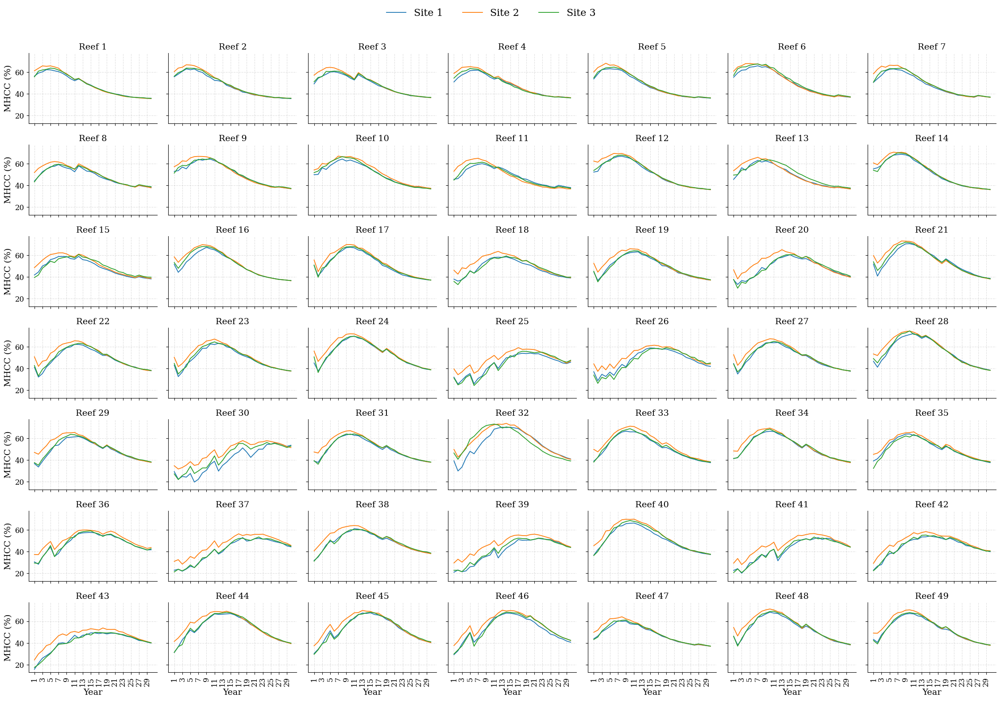

In [27]:
# Natural order for reefs like "Reef 1", "Reef 2", ...
reefs = sorted(df["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

# Custom site colours (same style as your reference)
# palette = {"Site 1": "#E78AC3", "Site 2": "#66C2A5", "Site 3": "#8DA0CB"}

# Facet by reef, lines by site

# plt.rcParams["font.family"] = "Times New Roman"
# plt.rcParams.update({
#     "font.size": 15,          # base font size
#     "axes.titlesize": 15,     # facet titles
#     "axes.labelsize": 15,     # x/y labels
#     "xtick.labelsize": 15,
#     "ytick.labelsize": 15,
#     "legend.title_fontsize": 15,
#     "legend.fontsize": 15
# })

#updated font for papper
mpl.rcParams.update({
    "font.family": "serif",
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,

    "legend.fontsize": 16,
    "legend.title_fontsize": 14,
    "legend.frameon": False,
})


g = sns.FacetGrid(
    df,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs 
    # palette=palette
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

# # Titles, labels, legend
# g.add_legend(title="")


g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    # ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(df["year"].unique())[::2])  # every 2nd year
    ax.tick_params(axis='x', rotation=90)

# g.fig.suptitle("Only Cyclone - Depth = 10", fontsize=16, y=1.03)

# Then adjust spacing and add title / legend
g.fig.subplots_adjust(top=0.90, hspace=0.35)

g.fig.suptitle(
    "",
    fontsize=20,
    y=0.99,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.03),   # lower than suptitle
    ncol=3,
    frameon=False,
    borderaxespad=0
)

g.tight_layout()
# plt.show()


import os

output_dir = "figures_for_paper"
os.makedirs(output_dir, exist_ok=True)

# svg_path = os.path.join(output_dir, f"{gam}_ts_obs_and_pred.svg")
pdf_path = os.path.join(output_dir, "ts_obs.pdf")

# Save from the FacetGrid figure
# g.fig.savefig(svg_path, bbox_inches="tight")
g.fig.savefig(pdf_path, bbox_inches="tight")

plt.show()


# FOR ANZIAM PPT

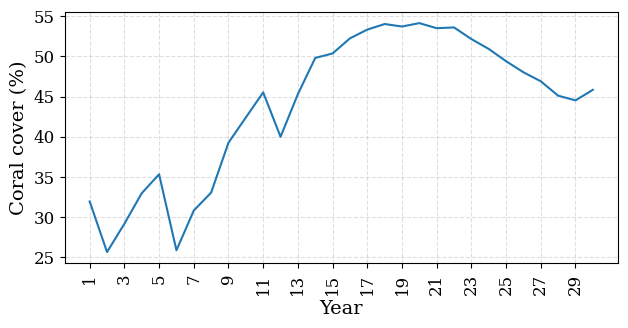

Saved: figures_for_paper\ANZIAM_ts_obs_Reef25_Site1.svg


In [19]:

reef_to_plot = "Reef 25"
site_to_plot = "Site 1"  

df_plot = df[
    (df["REEF_NAME"] == reef_to_plot) &
    (df["SITE_NO"] == site_to_plot)
]

# # ----------------------------
# # 2) Paper-style fonts
# # ----------------------------
# mpl.rcParams.update({
#     "font.family": "serif",
#     "font.size": 14,
#     "axes.titlesize": 16,
#     "axes.labelsize": 14,
#     "xtick.labelsize": 12,
#     "ytick.labelsize": 12,
#     "legend.frameon": False,
# })


mpl.rcParams.update({
    "font.family": "serif",
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.frameon": False,
})


# ----------------------------
# 3) Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(6.5, 3.5))

sns.lineplot(
    data=df_plot,
    x="year",
    y="mean_hcc",
    linewidth=1.5,
    errorbar=None,
    ax=ax
)

ax.set_xlabel("Year")
ax.set_ylabel("Coral cover (%)")
# ax.set_title("Reef 25 – Site 1")

# Grid + ticks
years_sorted = sorted(df_plot["year"].unique())
ax.set_xticks(years_sorted[::2])
ax.tick_params(axis="x", rotation=90)
ax.grid(True, linestyle="--", alpha=0.4)

# Optional: test/train split marker
# test_start_year = 30
# ax.axvline(x=test_start_year, color="black", linestyle="--", linewidth=1)

plt.tight_layout()

# ----------------------------
# 4) Save
# ----------------------------
output_dir = "figures_for_paper"
os.makedirs(output_dir, exist_ok=True)

pdf_path = os.path.join(output_dir, "ANZIAM_ts_obs_Reef25_Site1.svg")
plt.savefig(pdf_path, bbox_inches="tight")
plt.show()

print("Saved:", pdf_path)


# Mark test data points

AttributeError: 'FacetGrid' object has no attribute '_legend_box'

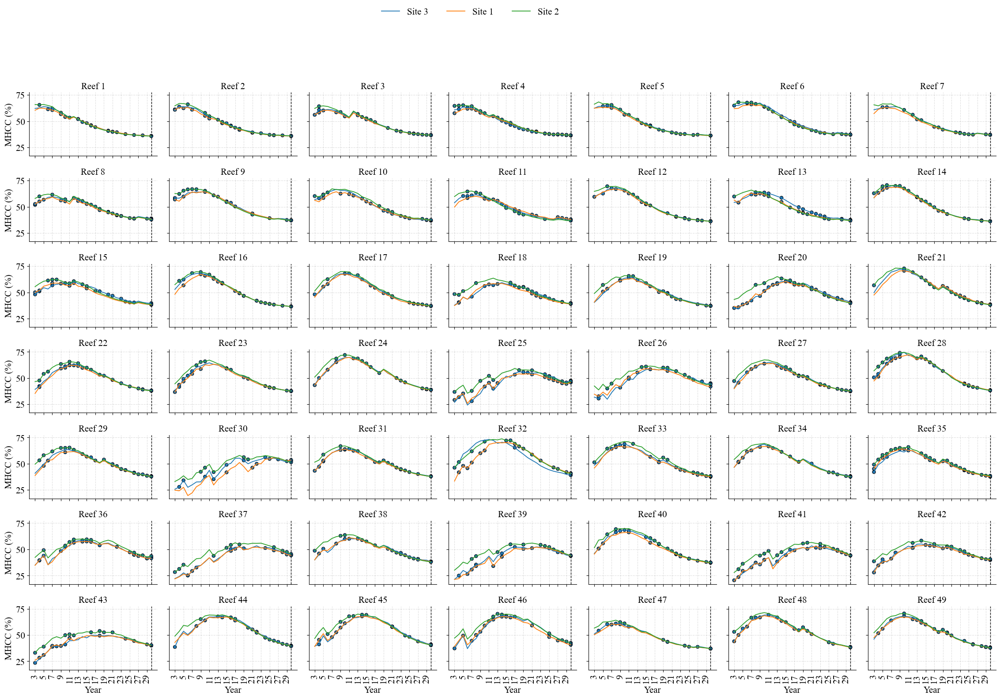

In [96]:
# --- after you build `train`, `val`, `test` -------------------------------
train = train.copy();  train["split"] = "train"
test  = test.copy();   test["split"]  = "test"

traintest = pd.concat([train, test], ignore_index=False)

# --- plotting --------------------------------------------------------------
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

# order reefs naturally (Reef 1, Reef 2, …)
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

g = sns.FacetGrid(
    traintest, col="REEF_NAME", col_wrap=7, hue="SITE_NO",
    height=2.2, aspect=1.5, sharey=True, col_order=reefs
)

# 1) time-series lines (all points)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

# 2) overlay TEST points only (hollow circles with black edge)
def plot_test_markers(data, **kws):
    dtest = data[data["split"] == "test"]
    if not dtest.empty:
        sns.scatterplot(
            data=dtest, x="year", y="mean_hcc",
            s=28, marker="o", linewidth=0.8, edgecolor="black",
            facecolors="none",  # hollow
            hue="SITE_NO", legend=False  # keep site colors
        )

g.map_dataframe(plot_test_markers)

# axes cosmetics
g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# main title + legend (sites)
g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.fig.suptitle("", fontsize=20, y=0.99, x=0.4, ha="center")

leg = g.add_legend(title="", loc="upper center",
                   bbox_to_anchor=(0.4, 1.03), ncol=3, frameon=False, borderaxespad=0)

# add a small proxy handle for "Test point" to the legend
from matplotlib.lines import Line2D
test_handle = Line2D([0], [0], marker='o', linestyle='None', markerfacecolor='none',
                     markeredgecolor='black', markeredgewidth=0.8, label='Test point')
leg._legend_box.align = "left"
handles, labels = leg.legendHandles, [t.get_text() for t in leg.texts]
handles.append(test_handle); labels.append("Test point")
leg.clear()  # rebuild legend with extra handle
leg._set_loc(leg._loc)
leg.set_title("")
for h, lab in zip(handles, labels):
    leg._legend_box._children[1]._children.append(h)  # handles column
    leg._legend_box._children[0]._children.append(plt.Text(text=lab))  # labels column

g.tight_layout()
plt.show()


# Validation outliers

In [13]:
# 1) Load the outlier table (row numbers are 1-based for X_val_scaled)
tbl = pd.read_csv("val_outliers_table.csv")   # columns: GAM, RF, BRT, MLP

def one_based_to_zero_based(series: pd.Series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()   # 1-based -> 0-based iloc positions

# 2) Build per-model outlier tables using trainvaltest for metadata
outlier_views = {}

for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])   # 0-based iloc positions in X_val_scaled
    idxs = X_val_scaled.index[pos]               # original indices (match trainvaltest.index)

    # Scaled rows (preserve order of 'pos')
    subset = X_val_scaled.iloc[pos].copy()

    # Metadata from trainvaltest (REEF + site + raw year)
    meta = trainvaltest.loc[idxs, ['REEF_NAME', 'SITE_NO', 'site_name', 'year']].copy()

    # Stitch together: add identifying columns to the left
    subset.insert(0, 'orig_index', idxs)
    subset.insert(1, 'REEF_NAME', meta['REEF_NAME'].values)
    subset.insert(2, 'SITE_NO',   meta['SITE_NO'].values)
    subset.insert(3, 'site_name', meta['site_name'].values)
    subset.insert(4, 'year_raw',  meta['year'].values)   # avoid clashing with scaled 'year' column

    outlier_views[model] = subset.reset_index(drop=True)
    subset.to_csv(f"val_outliers_rows_{model}.csv", index=False)

# 3) Quick summary
for model, df_out in outlier_views.items():
    print(f"{model}: {len(df_out)} outliers extracted")


FileNotFoundError: [Errno 2] No such file or directory: 'val_outliers_table.csv'

## extract long lat as well

In [14]:
# 1) Load the outlier table (row numbers are 1-based for X_val_scaled)
tbl = pd.read_csv("val_outliers_table.csv")   # columns: GAM, RF, BRT, MLP

def one_based_to_zero_based(series: pd.Series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()   # 1-based -> 0-based iloc positions

# 2) Build per-model outlier tables using trainvaltest for metadata
outlier_views = {}

for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])   # 0-based iloc positions in X_val_scaled
    idxs = X_val_scaled.index[pos]               # original indices (match trainvaltest.index)

    # Scaled rows (preserve order of 'pos')
    subset = X_val_scaled.iloc[pos].copy()

    # Metadata from trainvaltest (REEF + site + raw year)
    meta = trainvaltest.loc[idxs, ['REEF_NAME', 'SITE_NO', 'site_name', 'year', 'site_longitude','site_latitude']].copy()

    # Stitch together: add identifying columns to the left
    subset.insert(0, 'orig_index', idxs)
    subset.insert(1, 'REEF_NAME', meta['REEF_NAME'].values)
    subset.insert(2, 'SITE_NO',   meta['SITE_NO'].values)
    subset.insert(3, 'site_name', meta['site_name'].values)
    subset.insert(4, 'year_raw',  meta['year'].values) 
    subset.insert(5, 'longitude_raw',  meta['site_longitude'].values)  
    subset.insert(6, 'latitude_raw',  meta['site_latitude'].values)  # avoid clashing with scaled 'year' column

    outlier_views[model] = subset.reset_index(drop=True)
    subset.to_csv(f"val_outliers_rows_{model}.csv", index=False)

# 3) Quick summary
for model, df_out in outlier_views.items():
    print(f"{model}: {len(df_out)} outliers extracted")

GAM: 17 outliers extracted
RF: 26 outliers extracted
BRT: 21 outliers extracted
MLP: 62 outliers extracted


In [15]:
df_gam = pd.read_csv("val_outliers_rows_GAM.csv")
df_rf  = pd.read_csv("val_outliers_rows_RF.csv")
df_brt = pd.read_csv("val_outliers_rows_BRT.csv")
df_mlp = pd.read_csv("val_outliers_rows_MLP.csv")

# Add a 'Model' column to each
df_gam['Model'] = 'GAM'
df_rf['Model']  = 'RF'
df_brt['Model'] = 'BRT'
df_mlp['Model'] = 'MLP'

# Combine into one DataFrame
combined_df = pd.concat([df_gam, df_rf, df_brt, df_mlp], ignore_index=True)

combined_df.to_csv("val_all_outliers.csv")



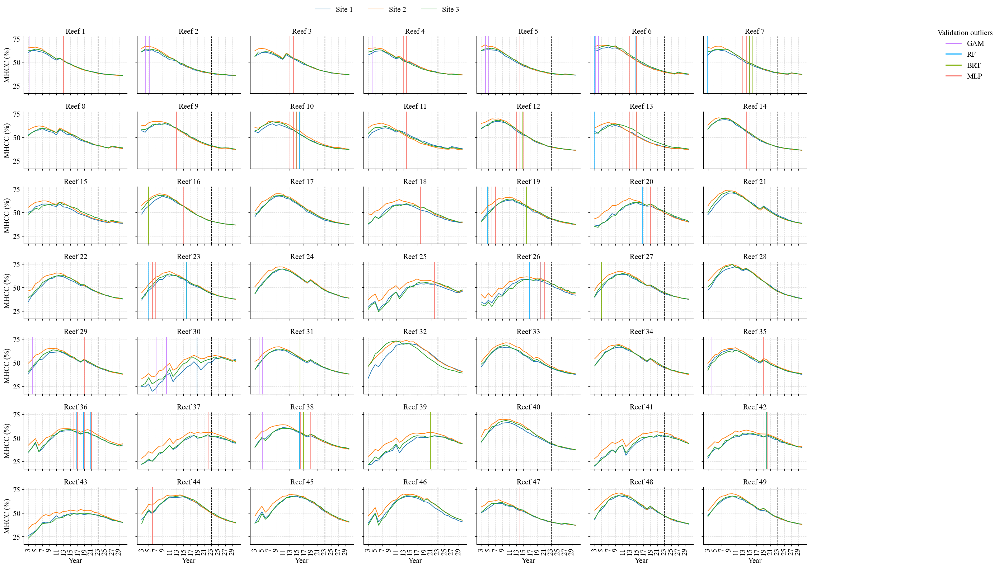

In [16]:
# === 1. Base time-series facet plot ===
reefs = sorted(trainvaltest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    trainvaltest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 23
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(trainvaltest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.03),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("val_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_val_scaled.index[pos]
    look = (trainvaltest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years

model_colors = {
    "GAM":"#C77CFF",      
    "RF": "#00A9FF",     
    "BRT": "#7CAE00",   
    "MLP": "#F8766D",  
}
x_offset = {"RF": -0.15, "BRT": -0.05, "MLP": 0.05, "GAM": 0.15}

# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y + x_offset.get(model, 0.0),
                color=model_colors.get(model, "k"),
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )

# add legend for outlier models
handles = [Line2D([0], [0], color=model_colors[m], lw=2) for m in model_colors]
labels  = list(model_colors.keys())
g.fig.legend(handles, labels, title="Validation outliers",
             loc="upper center", bbox_to_anchor=(0.99, 0.995), frameon=False)


# === 3. Show final figure ===
g.tight_layout()
plt.show()


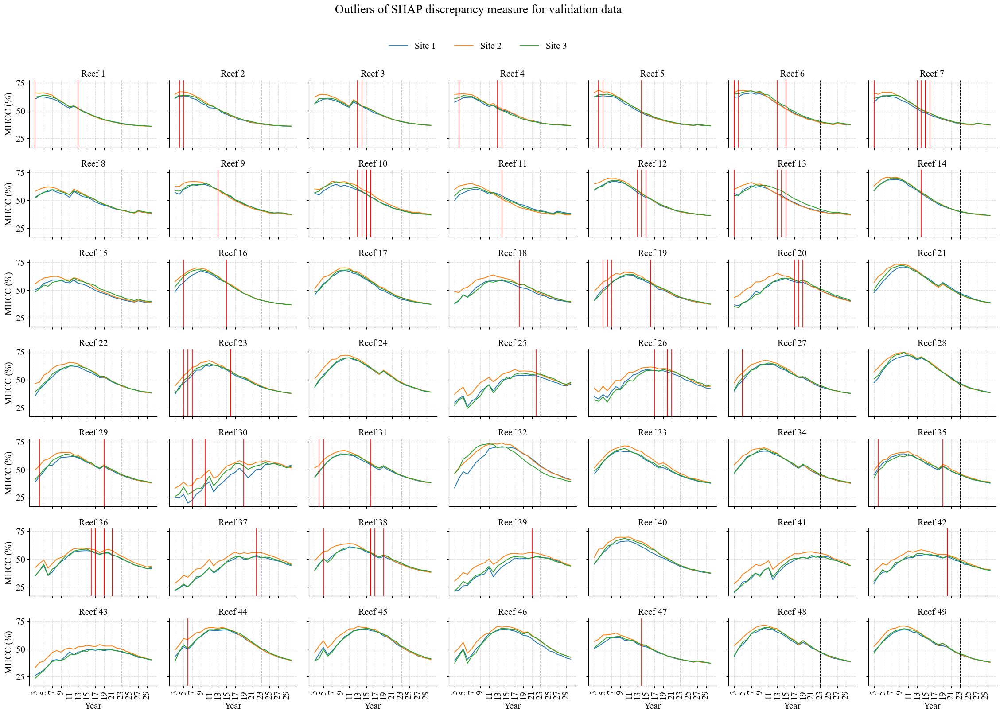

In [26]:
# === 1. Base time-series facet plot ===
reefs = sorted(trainvaltest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    trainvaltest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 23
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(trainvaltest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for validation data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("val_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_val_scaled.index[pos]
    look = (trainvaltest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years

# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )

# === 3. Show final figure ===
g.tight_layout()
plt.savefig("val_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


# Test outliers

In [71]:

# 1) Load the outlier table (row numbers are 1-based for X_val_scaled)
tbl = pd.read_csv("test_outliers_table.csv")   # columns: GAM, RF, BRT, MLP

def one_based_to_zero_based(series: pd.Series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()   # 1-based -> 0-based iloc positions

# 2) Build per-model outlier tables using trainvaltest for metadata
outlier_views = {}

for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])   # 0-based iloc positions in X_val_scaled
    idxs = X_test_scaled.index[pos]               # original indices (match trainvaltest.index)

    # Scaled rows (preserve order of 'pos')
    subset = X_test_scaled.iloc[pos].copy()

    # Metadata from trainvaltest (REEF + site + raw year)
    meta = traintest.loc[idxs, ['REEF_NAME', 'SITE_NO', 'site_name', 'year','site_longitude','site_latitude']].copy()

    # Stitch together: add identifying columns to the left
    subset.insert(0, 'orig_index', idxs)
    subset.insert(1, 'REEF_NAME', meta['REEF_NAME'].values)
    subset.insert(2, 'SITE_NO',   meta['SITE_NO'].values)
    subset.insert(3, 'site_name', meta['site_name'].values)
    subset.insert(4, 'year_raw',  meta['year'].values)   # avoid clashing with scaled 'year' column
    subset.insert(5, 'longitude_raw',  meta['site_longitude'].values)  
    subset.insert(6, 'latitude_raw',  meta['site_latitude'].values) 

    outlier_views[model] = subset.reset_index(drop=True)
    subset.to_csv(f"test_outliers_rows_{model}.csv", index=False)

# 3) Quick summary
for model, df_out in outlier_views.items():
    print(f"{model}: {len(df_out)} outliers extracted")



GAM: 63 outliers extracted
RF: 46 outliers extracted
BRT: 35 outliers extracted
MLP: 57 outliers extracted


In [72]:
df_gam = pd.read_csv("test_outliers_rows_GAM.csv")
df_rf  = pd.read_csv("test_outliers_rows_RF.csv")
df_brt = pd.read_csv("test_outliers_rows_BRT.csv")
df_mlp = pd.read_csv("test_outliers_rows_MLP.csv")

# Add a 'Model' column to each
df_gam['Model'] = 'GAM'
df_rf['Model']  = 'RF'
df_brt['Model'] = 'BRT'
df_mlp['Model'] = 'MLP'

# Combine into one DataFrame
combined_df = pd.concat([df_gam, df_rf, df_brt, df_mlp], ignore_index=True)

combined_df.to_csv("test_all_outliers.csv")



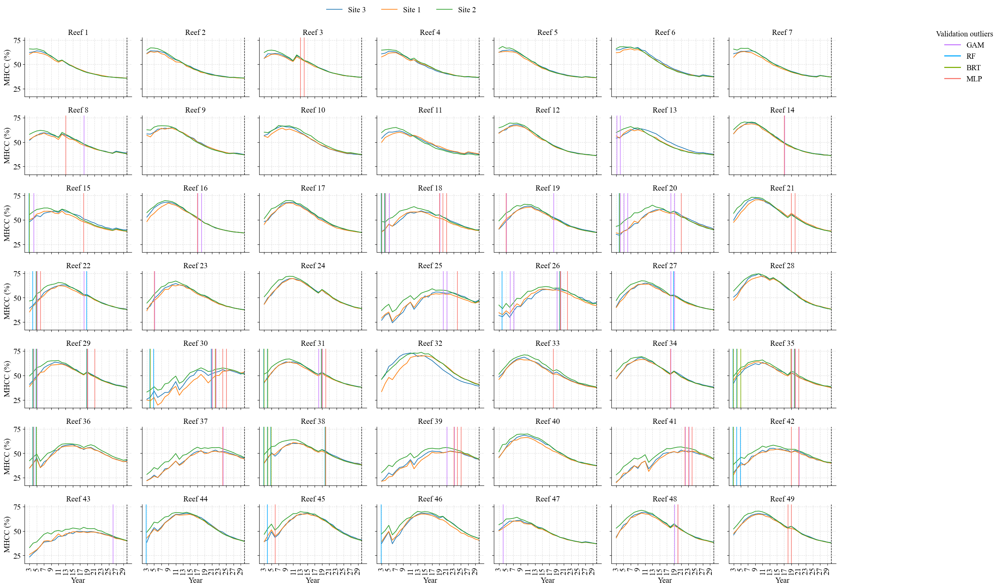

In [73]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.03),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("test_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_test_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years

model_colors = {
    "GAM":"#C77CFF",      # purple
    "RF": "#00A9FF",       # blue
    "BRT": "#7CAE00",      # green
    "MLP": "#F8766D",      # reddish
}
x_offset = {"RF": -0.15, "BRT": -0.05, "MLP": 0.05, "GAM": 0.15}

# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y + x_offset.get(model, 0.0),
                color=model_colors.get(model, "k"),
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )

# add legend for outlier models
handles = [Line2D([0], [0], color=model_colors[m], lw=2) for m in model_colors]
labels  = list(model_colors.keys())
g.fig.legend(handles, labels, title="Validation outliers",
             loc="upper right", bbox_to_anchor=(0.99, 0.995), frameon=False)

# === 3. Show final figure ===
g.tight_layout()
plt.show()


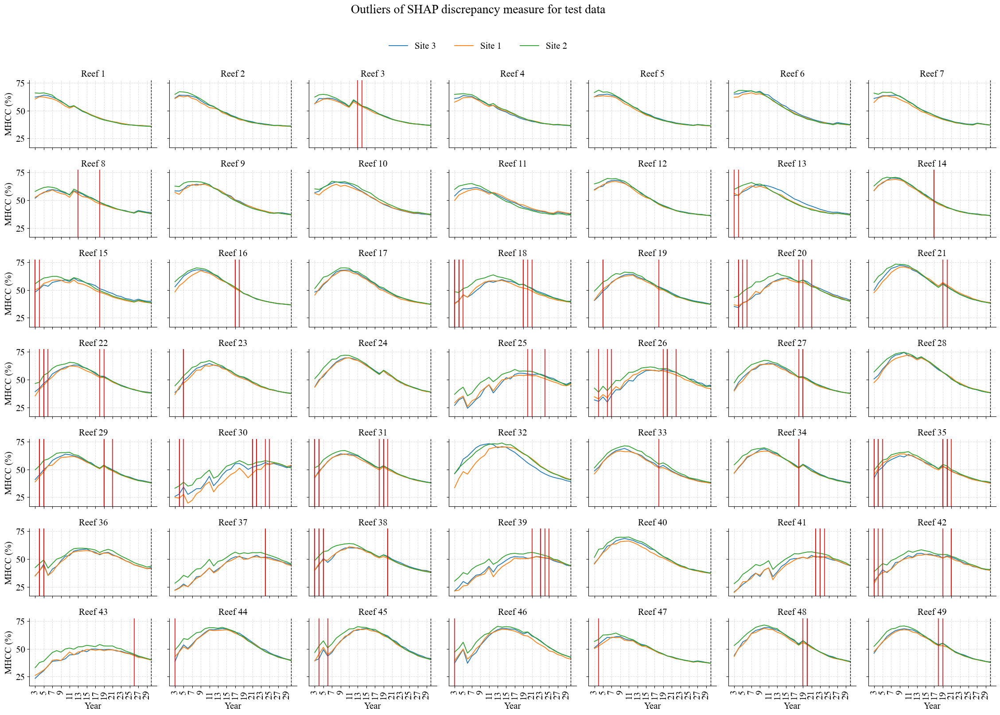

In [74]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for test data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("test_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_test_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years


# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )


# === 3. Show final figure ===
g.tight_layout()
plt.savefig("test_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


## Test outliers with test data points

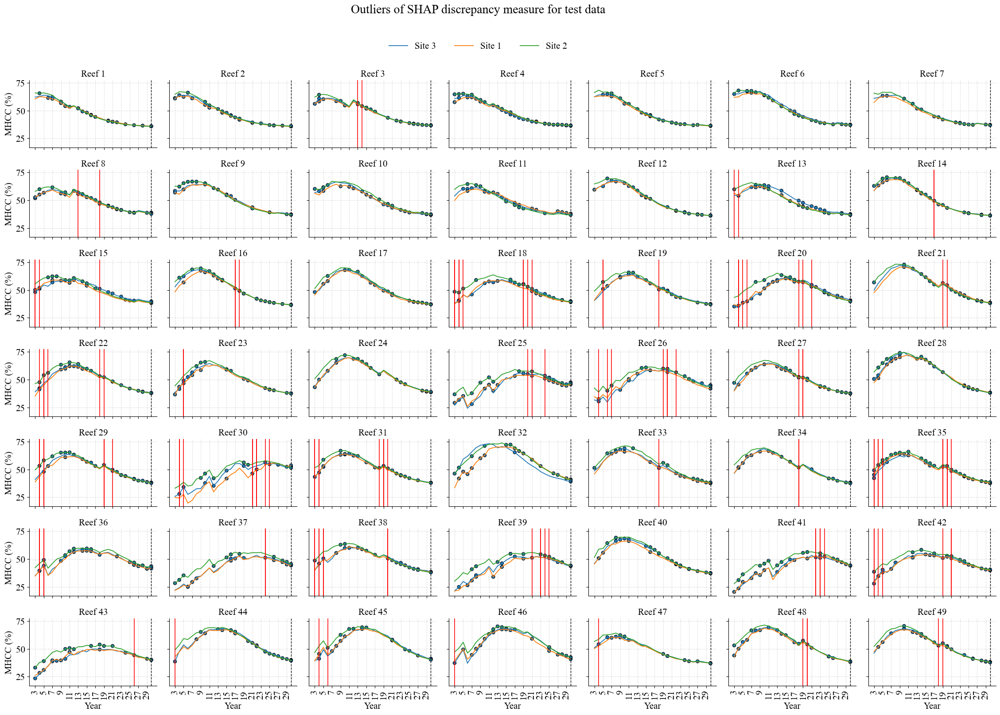

In [101]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)


#################################################################################
# 2) overlay TEST points only (hollow circles with black edge)
def plot_test_markers(data, **kws):
    dtest = data[data["split"] == "test"]
    if not dtest.empty:
        sns.scatterplot(
            data=dtest, x="year", y="mean_hcc",
            s=28, marker="o", linewidth=0.8, edgecolor="black",
            facecolors="none",  # hollow
            hue="SITE_NO", legend=False  # keep site colors
        )

g.map_dataframe(plot_test_markers)
####################################################################################

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for test data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("test_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_test_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years


# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )


# === 3. Show final figure ===
g.tight_layout()
plt.savefig("test_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


In [38]:
val["REEF_NAME"].unique()

array(['Reef 40', 'Reef 44', 'Reef 16', 'Reef 29', 'Reef 35', 'Reef 14',
       'Reef 3', 'Reef 18', 'Reef 19', 'Reef 9', 'Reef 15', 'Reef 28',
       'Reef 38', 'Reef 30', 'Reef 5', 'Reef 8', 'Reef 31', 'Reef 37',
       'Reef 36', 'Reef 46', 'Reef 11', 'Reef 20', 'Reef 43', 'Reef 34',
       'Reef 13', 'Reef 21', 'Reef 45', 'Reef 42', 'Reef 26', 'Reef 22',
       'Reef 10', 'Reef 25', 'Reef 32', 'Reef 2', 'Reef 41', 'Reef 49',
       'Reef 4', 'Reef 39', 'Reef 17', 'Reef 48', 'Reef 6', 'Reef 33',
       'Reef 1', 'Reef 24', 'Reef 27', 'Reef 12', 'Reef 23', 'Reef 47',
       'Reef 7'], dtype=object)

In [39]:
val_reefs = sorted(val["REEF_NAME"].unique(), key=lambda s: int(s.split()[1]))
val_reefs

['Reef 1',
 'Reef 2',
 'Reef 3',
 'Reef 4',
 'Reef 5',
 'Reef 6',
 'Reef 7',
 'Reef 8',
 'Reef 9',
 'Reef 10',
 'Reef 11',
 'Reef 12',
 'Reef 13',
 'Reef 14',
 'Reef 15',
 'Reef 16',
 'Reef 17',
 'Reef 18',
 'Reef 19',
 'Reef 20',
 'Reef 21',
 'Reef 22',
 'Reef 23',
 'Reef 24',
 'Reef 25',
 'Reef 26',
 'Reef 27',
 'Reef 28',
 'Reef 29',
 'Reef 30',
 'Reef 31',
 'Reef 32',
 'Reef 33',
 'Reef 34',
 'Reef 35',
 'Reef 36',
 'Reef 37',
 'Reef 38',
 'Reef 39',
 'Reef 40',
 'Reef 41',
 'Reef 42',
 'Reef 43',
 'Reef 44',
 'Reef 45',
 'Reef 46',
 'Reef 47',
 'Reef 48',
 'Reef 49']

In [40]:
sorted(val["year"].unique())

[3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [41]:
sorted(train["year"].unique())

[3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [42]:
train_reefs = sorted(train["REEF_NAME"].unique(), key=lambda s: int(s.split()[1]))
train_reefs

['Reef 1',
 'Reef 2',
 'Reef 3',
 'Reef 4',
 'Reef 5',
 'Reef 6',
 'Reef 7',
 'Reef 8',
 'Reef 9',
 'Reef 10',
 'Reef 11',
 'Reef 12',
 'Reef 13',
 'Reef 14',
 'Reef 15',
 'Reef 16',
 'Reef 17',
 'Reef 18',
 'Reef 19',
 'Reef 20',
 'Reef 21',
 'Reef 22',
 'Reef 23',
 'Reef 24',
 'Reef 25',
 'Reef 26',
 'Reef 27',
 'Reef 28',
 'Reef 29',
 'Reef 30',
 'Reef 31',
 'Reef 32',
 'Reef 33',
 'Reef 34',
 'Reef 35',
 'Reef 36',
 'Reef 37',
 'Reef 38',
 'Reef 39',
 'Reef 40',
 'Reef 41',
 'Reef 42',
 'Reef 43',
 'Reef 44',
 'Reef 45',
 'Reef 46',
 'Reef 47',
 'Reef 48',
 'Reef 49']

# Training outliers

In [75]:

# 1) Load the outlier table (row numbers are 1-based for X_val_scaled)
tbl = pd.read_csv("train_outliers_table.csv")   # columns: GAM, RF, BRT, MLP

def one_based_to_zero_based(series: pd.Series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()   # 1-based -> 0-based iloc positions

# 2) Build per-model outlier tables using trainvaltest for metadata
outlier_views = {}

for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])   # 0-based iloc positions in X_val_scaled
    idxs = X_train_scaled.index[pos]               # original indices (match trainvaltest.index)

    # Scaled rows (preserve order of 'pos')
    subset = X_train_scaled.iloc[pos].copy()

    # Metadata from trainvaltest (REEF + site + raw year)
    meta = traintest.loc[idxs, ['REEF_NAME', 'SITE_NO', 'site_name', 'year','site_longitude','site_latitude']].copy()

    # Stitch together: add identifying columns to the left
    subset.insert(0, 'orig_index', idxs)
    subset.insert(1, 'REEF_NAME', meta['REEF_NAME'].values)
    subset.insert(2, 'SITE_NO',   meta['SITE_NO'].values)
    subset.insert(3, 'site_name', meta['site_name'].values)
    subset.insert(4, 'year_raw',  meta['year'].values)   # avoid clashing with scaled 'year' column
    subset.insert(5, 'longitude_raw',  meta['site_longitude'].values)  
    subset.insert(6, 'latitude_raw',  meta['site_latitude'].values) 

    outlier_views[model] = subset.reset_index(drop=True)
    subset.to_csv(f"train_outliers_rows_{model}.csv", index=False)

# 3) Quick summary
for model, df_out in outlier_views.items():
    print(f"{model}: {len(df_out)} outliers extracted")



GAM: 143 outliers extracted
RF: 71 outliers extracted
BRT: 39 outliers extracted
MLP: 146 outliers extracted


In [76]:
df_gam = pd.read_csv("train_outliers_rows_GAM.csv")
df_rf  = pd.read_csv("train_outliers_rows_RF.csv")
df_brt = pd.read_csv("train_outliers_rows_BRT.csv")
df_mlp = pd.read_csv("train_outliers_rows_MLP.csv")

# Add a 'Model' column to each
df_gam['Model'] = 'GAM'
df_rf['Model']  = 'RF'
df_brt['Model'] = 'BRT'
df_mlp['Model'] = 'MLP'

# Combine into one DataFrame
combined_df = pd.concat([df_gam, df_rf, df_brt, df_mlp], ignore_index=True)

combined_df.to_csv("train_all_outliers.csv")



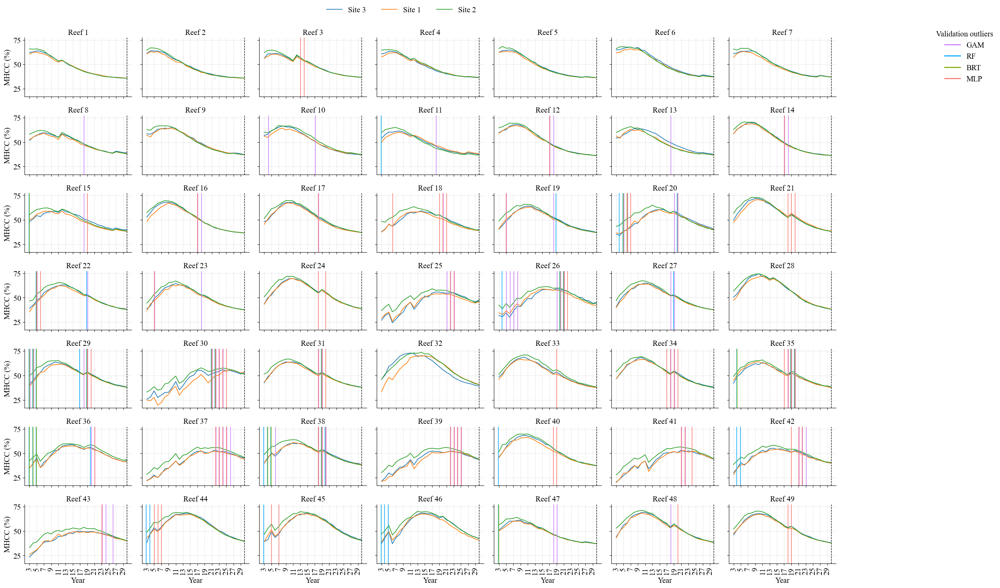

In [49]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.03),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("train_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_train_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years

model_colors = {
    "GAM":"#C77CFF",      # purple
    "RF": "#00A9FF",       # blue
    "BRT": "#7CAE00",      # green
    "MLP": "#F8766D",      # reddish
}
x_offset = {"RF": -0.15, "BRT": -0.05, "MLP": 0.05, "GAM": 0.15}

# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y + x_offset.get(model, 0.0),
                color=model_colors.get(model, "k"),
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )

# add legend for outlier models
handles = [Line2D([0], [0], color=model_colors[m], lw=2) for m in model_colors]
labels  = list(model_colors.keys())
g.fig.legend(handles, labels, title="Validation outliers",
             loc="upper right", bbox_to_anchor=(0.99, 0.995), frameon=False)

# === 3. Show final figure ===
g.tight_layout()
plt.show()


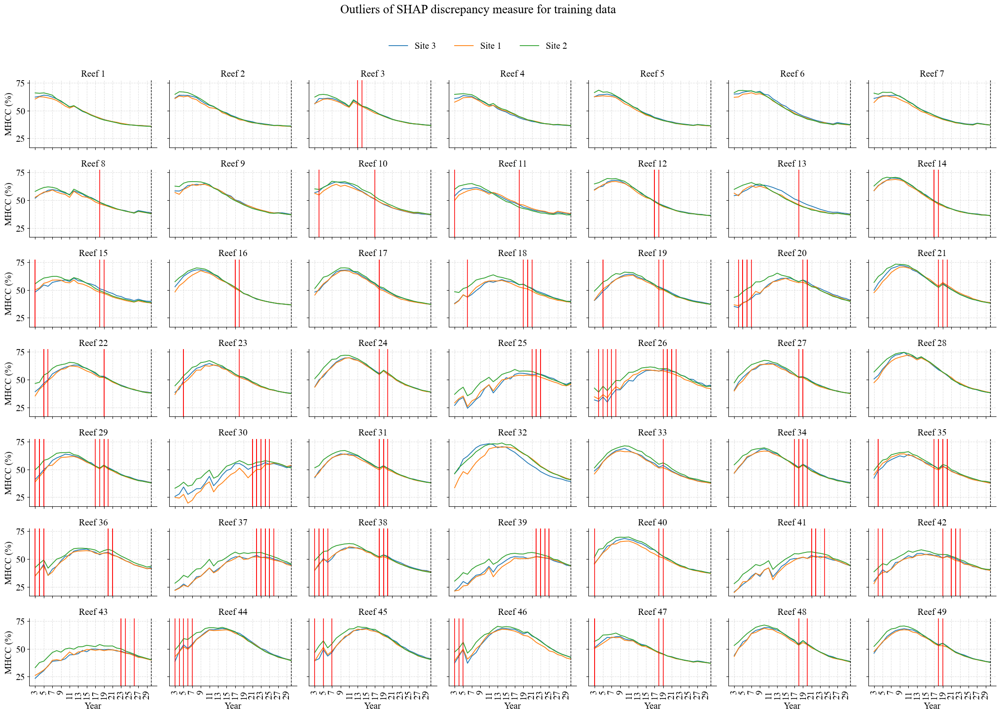

In [56]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for training data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("train_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_train_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years


# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )


# === 3. Show final figure ===
g.tight_layout()
plt.savefig("train_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


## Training outliers with test data points

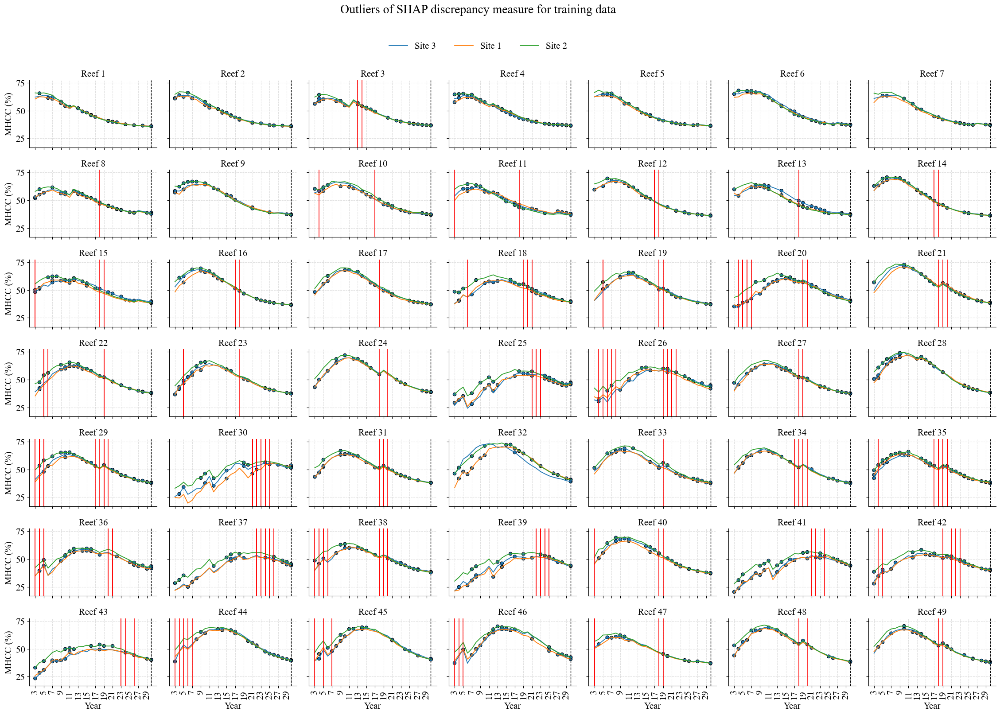

In [98]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

##################################################################
# 2) overlay TEST points only (hollow circles with black edge)
def plot_test_markers(data, **kws):
    dtest = data[data["split"] == "test"]
    if not dtest.empty:
        sns.scatterplot(
            data=dtest, x="year", y="mean_hcc",
            s=28, marker="o", linewidth=0.8, edgecolor="black",
            facecolors="none",  # hollow
            hue="SITE_NO", legend=False  # keep site colors
        )

g.map_dataframe(plot_test_markers)
###########################################################################

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for training data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("train_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_train_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years


# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )


# === 3. Show final figure ===
g.tight_layout()
plt.savefig("train_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


In [51]:
train["REEF_NAME"].unique()

array(['Reef 16', 'Reef 13', 'Reef 29', 'Reef 18', 'Reef 14', 'Reef 9',
       'Reef 15', 'Reef 12', 'Reef 2', 'Reef 37', 'Reef 17', 'Reef 31',
       'Reef 26', 'Reef 40', 'Reef 49', 'Reef 33', 'Reef 11', 'Reef 22',
       'Reef 6', 'Reef 23', 'Reef 24', 'Reef 30', 'Reef 42', 'Reef 10',
       'Reef 38', 'Reef 27', 'Reef 25', 'Reef 1', 'Reef 32', 'Reef 44',
       'Reef 28', 'Reef 36', 'Reef 41', 'Reef 3', 'Reef 43', 'Reef 4',
       'Reef 45', 'Reef 48', 'Reef 21', 'Reef 19', 'Reef 47', 'Reef 7',
       'Reef 39', 'Reef 46', 'Reef 35', 'Reef 20', 'Reef 5', 'Reef 8',
       'Reef 34'], dtype=object)

In [52]:
train_reefs = sorted(train["REEF_NAME"].unique(), key=lambda s: int(s.split()[1]))
train_reefs

['Reef 1',
 'Reef 2',
 'Reef 3',
 'Reef 4',
 'Reef 5',
 'Reef 6',
 'Reef 7',
 'Reef 8',
 'Reef 9',
 'Reef 10',
 'Reef 11',
 'Reef 12',
 'Reef 13',
 'Reef 14',
 'Reef 15',
 'Reef 16',
 'Reef 17',
 'Reef 18',
 'Reef 19',
 'Reef 20',
 'Reef 21',
 'Reef 22',
 'Reef 23',
 'Reef 24',
 'Reef 25',
 'Reef 26',
 'Reef 27',
 'Reef 28',
 'Reef 29',
 'Reef 30',
 'Reef 31',
 'Reef 32',
 'Reef 33',
 'Reef 34',
 'Reef 35',
 'Reef 36',
 'Reef 37',
 'Reef 38',
 'Reef 39',
 'Reef 40',
 'Reef 41',
 'Reef 42',
 'Reef 43',
 'Reef 44',
 'Reef 45',
 'Reef 46',
 'Reef 47',
 'Reef 48',
 'Reef 49']

In [53]:
sorted(train["year"].unique())

[3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [54]:
sorted(train["year"].unique())

[3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [55]:
train_reefs = sorted(train["REEF_NAME"].unique(), key=lambda s: int(s.split()[1]))
train_reefs

['Reef 1',
 'Reef 2',
 'Reef 3',
 'Reef 4',
 'Reef 5',
 'Reef 6',
 'Reef 7',
 'Reef 8',
 'Reef 9',
 'Reef 10',
 'Reef 11',
 'Reef 12',
 'Reef 13',
 'Reef 14',
 'Reef 15',
 'Reef 16',
 'Reef 17',
 'Reef 18',
 'Reef 19',
 'Reef 20',
 'Reef 21',
 'Reef 22',
 'Reef 23',
 'Reef 24',
 'Reef 25',
 'Reef 26',
 'Reef 27',
 'Reef 28',
 'Reef 29',
 'Reef 30',
 'Reef 31',
 'Reef 32',
 'Reef 33',
 'Reef 34',
 'Reef 35',
 'Reef 36',
 'Reef 37',
 'Reef 38',
 'Reef 39',
 'Reef 40',
 'Reef 41',
 'Reef 42',
 'Reef 43',
 'Reef 44',
 'Reef 45',
 'Reef 46',
 'Reef 47',
 'Reef 48',
 'Reef 49']

# Common outlier data points

In [79]:
import pandas as pd
from itertools import combinations

# --- Load dataset ---
df = pd.read_csv("train_outliers_table.csv")

# --- Convert to integer type safely (handles NaNs) ---
df = df.astype("Int64")

# --- Create sets of outlier indices per model ---
model_sets = {col: set(df[col].dropna().astype(int)) for col in df.columns}

# --- Common indices across all models ---
common_all = set.intersection(*model_sets.values())

# --- Find pairwise and multi-model intersections (r = 2..len(models)) ---
common_subsets = {}
for r in range(2, len(model_sets) + 1):
    for combo in combinations(model_sets.keys(), r):
        inter = set.intersection(*(model_sets[m] for m in combo))
        if inter:
            common_subsets[combo] = inter

# --- Summary: counts + actual indices ---
print("Common Outliers Across ALL Models:")
print(sorted(common_all))
print()

print("Overlaps (Counts):")
for combo, inter in sorted(common_subsets.items(), key=lambda x: (len(x[0]), x[0])):
    print(f"{combo}: {len(inter)}")
print()

print("Overlaps (Actual Indices):")
for combo, inter in sorted(common_subsets.items(), key=lambda x: (len(x[0]), x[0])):
    print(f"{combo}: {sorted(inter)}")

# --- Optional: export each overlap to CSV files (uncomment to use) ---
# for combo, inter in common_subsets.items():
#     name = "_".join(combo)
#    pd.Series(sorted(inter), name="index").to_csv(f"overlap_{name}.csv", index=False)
# pd.Series(sorted(common_all), name="index").to_csv("overlap_ALL_MODELS.csv", index=False)


Common Outliers Across ALL Models:
[294, 318, 527, 539, 900, 1025, 1255, 1419, 1910, 2047, 2158, 2177]

Overlaps (Counts):
('BRT', 'MLP'): 15
('GAM', 'BRT'): 21
('GAM', 'MLP'): 77
('GAM', 'RF'): 26
('RF', 'BRT'): 36
('RF', 'MLP'): 15
('GAM', 'BRT', 'MLP'): 15
('GAM', 'RF', 'BRT'): 18
('GAM', 'RF', 'MLP'): 15
('RF', 'BRT', 'MLP'): 12
('GAM', 'RF', 'BRT', 'MLP'): 12

Overlaps (Actual Indices):
('BRT', 'MLP'): [149, 294, 318, 527, 539, 900, 1025, 1114, 1255, 1419, 1503, 1910, 2047, 2158, 2177]
('GAM', 'BRT'): [149, 294, 318, 476, 527, 539, 570, 748, 900, 1025, 1114, 1129, 1255, 1419, 1503, 1837, 1910, 2047, 2158, 2177, 2583]
('GAM', 'MLP'): [35, 39, 69, 84, 96, 100, 127, 143, 149, 193, 249, 294, 297, 307, 318, 425, 511, 522, 527, 539, 556, 581, 606, 638, 761, 818, 900, 955, 1009, 1010, 1025, 1040, 1114, 1121, 1169, 1172, 1255, 1345, 1355, 1360, 1361, 1371, 1377, 1406, 1419, 1423, 1476, 1484, 1503, 1530, 1681, 1697, 1729, 1749, 1885, 1910, 1972, 2004, 2047, 2085, 2110, 2130, 2149, 2158, 21

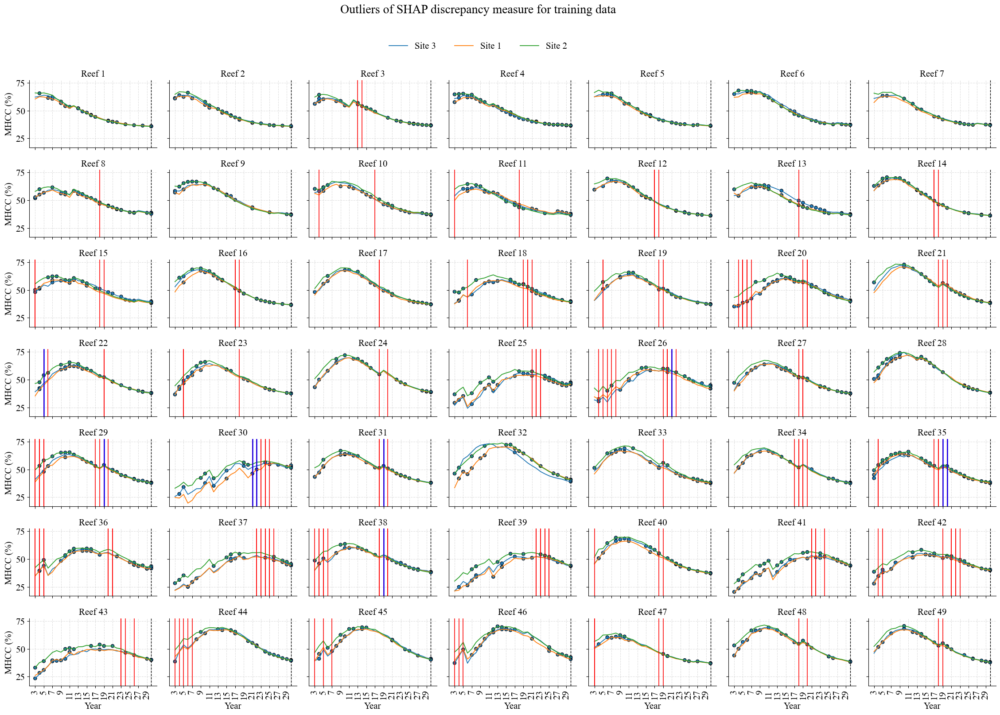

In [104]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)

##################################################################
# 2) overlay TEST points only (hollow circles with black edge)
def plot_test_markers(data, **kws):
    dtest = data[data["split"] == "test"]
    if not dtest.empty:
        sns.scatterplot(
            data=dtest, x="year", y="mean_hcc",
            s=28, marker="o", linewidth=0.8, edgecolor="black",
            facecolors="none",  # hollow
            hue="SITE_NO", legend=False  # keep site colors
        )

g.map_dataframe(plot_test_markers)
###########################################################################

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for training data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("train_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_train_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years



###################################################################################################

# --- Common-outlier years per reef (BLUE lines) ---------------------------
# NOTE: table indices are 1-based; convert to 0-based to index X_train_scaled
common_all = {294, 318, 527, 539, 900, 1025, 1255, 1419, 1910, 2047, 2158, 2177}
common_pos = [i - 1 for i in sorted(common_all)]

idxs_common = X_train_scaled.index[common_pos]
look_common = (traintest.loc[idxs_common, ['REEF_NAME', 'year']]
               .dropna()
               .drop_duplicates())

common_years_by_reef = (look_common.groupby('REEF_NAME')['year']
                                  .apply(lambda s: sorted(s.unique()))
                                  .to_dict())

##################################################################################################     
       
# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )

# BLUE: common across ALL models (draw last so it sits on top)
    for y in common_years_by_reef.get(reef_name, []):
        ax.axvline(x=y, color="blue", linestyle='-', linewidth=1.8, alpha=0.95, zorder=4)

# === 3. Show final figure ===
g.tight_layout()
plt.savefig("train_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


In [80]:
# --- Load dataset ---
df = pd.read_csv("test_outliers_table.csv")

# --- Convert to integer type safely (handles NaNs) ---
df = df.astype("Int64")

# --- Create sets of outlier indices per model ---
model_sets = {col: set(df[col].dropna().astype(int)) for col in df.columns}

# --- Common indices across all models ---
common_all = set.intersection(*model_sets.values())

# --- Find pairwise and multi-model intersections (r = 2..len(models)) ---
common_subsets = {}
for r in range(2, len(model_sets) + 1):
    for combo in combinations(model_sets.keys(), r):
        inter = set.intersection(*(model_sets[m] for m in combo))
        if inter:
            common_subsets[combo] = inter

# --- Summary: counts + actual indices ---
print("Common Outliers Across ALL Models:")
print(sorted(common_all))
print()

print("Overlaps (Counts):")
for combo, inter in sorted(common_subsets.items(), key=lambda x: (len(x[0]), x[0])):
    print(f"{combo}: {len(inter)}")
print()

print("Overlaps (Actual Indices):")
for combo, inter in sorted(common_subsets.items(), key=lambda x: (len(x[0]), x[0])):
    print(f"{combo}: {sorted(inter)}")

# --- Optional: export each overlap to CSV files (uncomment to use) ---
# for combo, inter in common_subsets.items():
#     name = "_".join(combo)
#    pd.Series(sorted(inter), name="index").to_csv(f"overlap_{name}.csv", index=False)
# pd.Series(sorted(common_all), name="index").to_csv("overlap_ALL_MODELS.csv", index=False)


Common Outliers Across ALL Models:
[39, 285, 401, 659, 915, 1102]

Overlaps (Counts):
('BRT', 'MLP'): 9
('GAM', 'BRT'): 17
('GAM', 'MLP'): 26
('GAM', 'RF'): 17
('RF', 'BRT'): 32
('RF', 'MLP'): 8
('GAM', 'BRT', 'MLP'): 8
('GAM', 'RF', 'BRT'): 15
('GAM', 'RF', 'MLP'): 7
('RF', 'BRT', 'MLP'): 7
('GAM', 'RF', 'BRT', 'MLP'): 6

Overlaps (Actual Indices):
('BRT', 'MLP'): [39, 285, 401, 612, 659, 882, 915, 1007, 1102]
('GAM', 'BRT'): [39, 139, 146, 285, 401, 407, 564, 659, 703, 795, 817, 882, 915, 926, 952, 1007, 1102]
('GAM', 'MLP'): [39, 81, 182, 285, 302, 312, 369, 401, 469, 620, 659, 746, 824, 863, 882, 915, 925, 934, 954, 1001, 1007, 1054, 1057, 1102, 1110, 1140]
('GAM', 'RF'): [39, 139, 146, 258, 285, 401, 407, 564, 659, 703, 795, 817, 915, 926, 952, 1102, 1140]
('RF', 'BRT'): [14, 39, 125, 139, 146, 192, 228, 285, 316, 388, 401, 407, 421, 551, 564, 612, 659, 681, 690, 703, 720, 795, 817, 915, 926, 952, 970, 1011, 1102, 1115, 1149, 1150]
('RF', 'MLP'): [39, 285, 401, 612, 659, 915, 1102

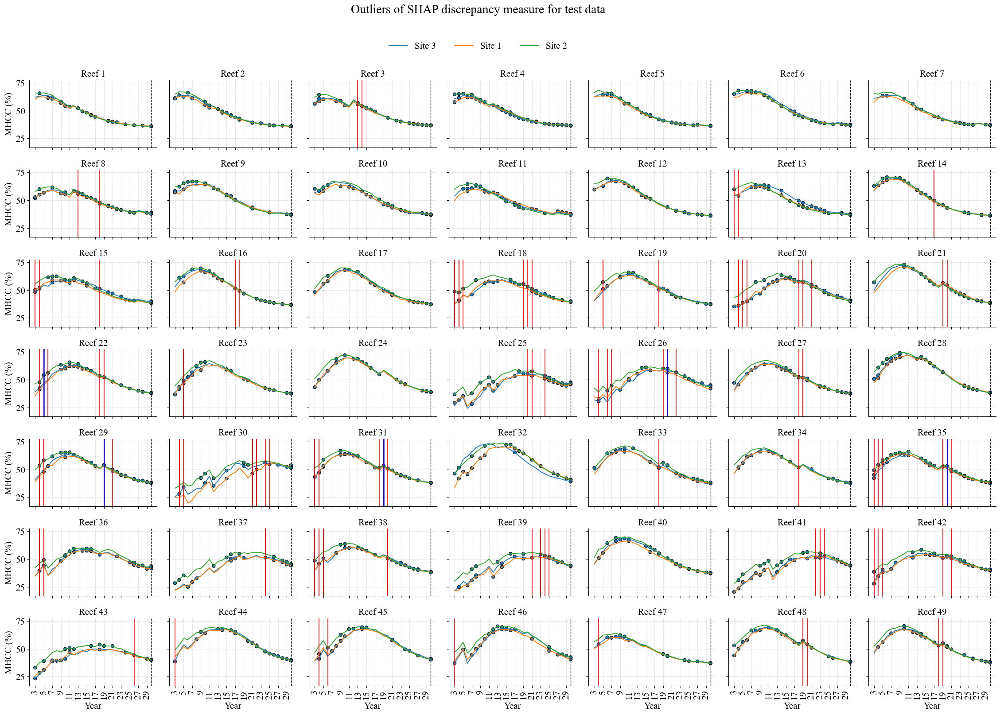

In [106]:
# === 1. Base time-series facet plot ===
reefs = sorted(traintest["REEF_NAME"].unique(),
               key=lambda s: int(re.search(r"\d+", s).group()))

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({
    "font.size": 15, "axes.titlesize": 15, "axes.labelsize": 15,
    "xtick.labelsize": 15, "ytick.labelsize": 15,
    "legend.title_fontsize": 15, "legend.fontsize": 15
})

g = sns.FacetGrid(
    traintest,
    col="REEF_NAME", col_wrap=7,
    hue="SITE_NO", height=2.2, aspect=1.5,
    sharey=True, col_order=reefs
)
g.map_dataframe(sns.lineplot, x="year", y="mean_hcc", linewidth=1.3, errorbar=None)


#################################################################################
# 2) overlay TEST points only (hollow circles with black edge)
def plot_test_markers(data, **kws):
    dtest = data[data["split"] == "test"]
    if not dtest.empty:
        sns.scatterplot(
            data=dtest, x="year", y="mean_hcc",
            s=28, marker="o", linewidth=0.8, edgecolor="black",
            facecolors="none",  # hollow
            hue="SITE_NO", legend=False  # keep site colors
        )

g.map_dataframe(plot_test_markers)
####################################################################################

g.set_axis_labels("Year", "MHCC (%)")
g.set_titles("{col_name}")

test_start_year = 30
for ax in g.axes.flatten():
    ax.axvline(x=test_start_year, color='black', linestyle='--', linewidth=1)
    ax.grid(True, linestyle="--", alpha=0.4)
    ax.set_xticks(sorted(traintest["year"].unique())[::2])
    ax.tick_params(axis='x', rotation=90)

# g.fig.subplots_adjust(top=0.90, hspace=0.35)
plt.subplots_adjust(top=0.85)

# Title at top, centered
g.fig.suptitle(
    "Outliers of SHAP discrepancy measure for test data",
    fontsize=20,
    y=1.05,   # vertical position
    x=0.4,    # center horizontally
    ha="center"
)

g.fig.subplots_adjust(top=0.90, hspace=0.35)
g.add_legend(
    title="",
    loc="upper center",
    bbox_to_anchor=(0.4, 1),
    ncol=3,
    frameon=False,
    borderaxespad=0
)

# === 2. ADD THIS BLOCK: mark outliers with vertical lines ===
tbl = pd.read_csv("test_outliers_table.csv")

def one_based_to_zero_based(series):
    s = series.dropna().astype(int)
    return (s - 1).tolist()

model_years_by_reef = {}
for model in tbl.columns:
    pos  = one_based_to_zero_based(tbl[model])
    idxs = X_test_scaled.index[pos]
    look = (traintest
            .loc[idxs, ['REEF_NAME', 'year']]
            .dropna()
            .drop_duplicates())
    reef2years = (look.groupby('REEF_NAME')['year']
                       .apply(lambda s: sorted(s.unique()))
                       .to_dict())
    model_years_by_reef[model] = reef2years


###################################################################################################

# --- Common-outlier years per reef (BLUE lines) ---------------------------
# NOTE: table indices are 1-based; convert to 0-based to index X_train_scaled
common_all = {39, 285, 401, 659, 915, 1102}
common_pos = [i - 1 for i in sorted(common_all)]

idxs_common = X_test_scaled.index[common_pos]
look_common = (traintest.loc[idxs_common, ['REEF_NAME', 'year']]
               .dropna()
               .drop_duplicates())

common_years_by_reef = (look_common.groupby('REEF_NAME')['year']
                                  .apply(lambda s: sorted(s.unique()))
                                  .to_dict())

##################################################################################################     

# draw lines
for ax in g.axes.flatten():
    reef_name = ax.get_title()
    for model, reef2years in model_years_by_reef.items():
        for y in reef2years.get(reef_name, []):
            ax.axvline(
                x=y,
                color="red",
                linestyle='-', linewidth=1.2, alpha=0.95, zorder=3
            )  

    # BLUE: common across ALL models (draw last so it sits on top)
    for y in common_years_by_reef.get(reef_name, []):
        ax.axvline(x=y, color="blue", linestyle='-', linewidth=1.8, alpha=0.95, zorder=4)

# === 3. Show final figure ===
g.tight_layout()
plt.savefig("test_outliers.svg", dpi=600, bbox_inches="tight")
plt.show()


In [108]:
look

,REEF_NAME,year
2569,Reef 35,20
2507,Reef 34,18
2417,Reef 33,18
3172,Reef 41,23
3231,Reef 41,22
3260,Reef 42,21
2932,Reef 39,23
2538,Reef 35,19
2809,Reef 38,20
2723,Reef 37,24


In [109]:
look_common

,REEF_NAME,year
1669,Reef 26,20
1938,Reef 29,19
2569,Reef 35,20
1294,Reef 22,5
2208,Reef 31,19


In [111]:
idxs_common

Index([1669, 1639, 1938, 2569, 1294, 2208], dtype='int64')

In [ ]:
X_test_scaled

# ploting time series plots for least SHAP discrepancy reef-site

In [1]:
reef_to_plot = "Reef 12"
site_to_plot = "Site 2"

df_sub = df[(df["REEF_NAME"] == reef_to_plot) &
            (df["SITE_NO"] == site_to_plot)]

plt.figure(figsize=(6,4))
sns.lineplot(data=df_sub, x="year", y="mean_hcc", linewidth=2)

plt.title(f"{reef_to_plot} – {site_to_plot}")
plt.xlabel("Year")
plt.ylabel("MHCC (%)")
plt.grid(True, linestyle="--", alpha=0.4)

plt.show()


NameError: name 'df' is not defined